# Using CNNs to Classify Images of American Sign Language (ASL) Letters 
In this project, our goal is to use the TensorFlow backend with the Keras Neural Network library to implement various neural network architectures (both shallow neural networks and convolutional neural networks) as image classification models for our open-source ASL data set obtained from Kaggle.

Data Source: https://www.kaggle.com/grassknoted/asl-alphabet

### Installation of Package Dependencies
Run this cell only the first time executing this code to ensure that all packages required for the project are installed correctly

In [0]:

# import sys
# !{sys.executable} -m pip install opencv-python
# !{sys.executable} -m pip install scikit-learn
# !{sys.executable} -m pip install pandas
# !{sys.executable} -m pip install matplotlib
# !{sys.executable} -m pip install tensorflow
# !{sys.executable} -m pip install keras
# !pip install kaggle
# !mv "/content/drive/My Drive/kaggle.json" /root/.kaggle/kaggle.json

### Necessary imports for this project

In [2]:
import cv2
import os
import random
import sys
from glob import glob

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf

from sklearn.decomposition import PCA

from tensorflow import keras
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

from tensorflow.keras.applications.resnet import ResNet50

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, GlobalAveragePooling2D


from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


# Import kaggle data using api

In [3]:
from googleapiclient.discovery import build
import io, os
from googleapiclient.http import MediaIoBaseDownload
from google.colab import auth
auth.authenticate_user()
drive_service = build('drive', 'v3')
results = drive_service.files().list(
        q="name = 'kaggle.json'", fields="files(id)").execute()
kaggle_api_key = results.get('files', [])
filename = "/root/.kaggle/kaggle.json"
os.makedirs(os.path.dirname(filename), exist_ok=True)
request = drive_service.files().get_media(fileId=kaggle_api_key[0]['id'])
fh = io.FileIO(filename, 'wb')
downloader = MediaIoBaseDownload(fh, request)
done = False
while done is False:
    status, done = downloader.next_chunk()
    print("Download %d%%." % int(status.progress() * 100))
os.chmod(filename, 600)

Download 100%.


In [4]:
#make sure that notebook is using GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [5]:
# Download kaggle.jsom API token and place in 'My Drive' 
#!mv "/content/drive/My Drive/kaggle.json" /root/.kaggle/kaggle.json
!kaggle datasets download -d grassknoted/asl-alphabet

100% 1.02G/1.03G [00:20<00:00, 79.3MB/s]
100% 1.03G/1.03G [00:20<00:00, 54.7MB/s]


In [6]:
#locate and unzip zip file with data
!ls /content/
!unzip /content/asl-alphabet.zip

adc.json  asl-alphabet.zip  drive  sample_data
Archive:  /content/asl-alphabet.zip
  inflating: asl_alphabet_test/asl_alphabet_test/A_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/B_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/C_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/D_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/E_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/F_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/G_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/H_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/I_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/J_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/K_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/L_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/M_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/N_test.jpg  
  inflating: asl_alphabet_test/asl_alphabet_test/

### Global variable definitions

In [7]:
# file path of data directory, relative to the current working directory
DATA_DIR = '/content/asl_alphabet_train'
print(DATA_DIR)
!ls /content/asl_alphabet_train/

/content/asl_alphabet_train
asl_alphabet_train


### Data Import
The data (images) are stored in sub-directories of the data directory, titled by the character the image represent. <br>
(e.g.: All the images that represent the letter 'R' are stored in a sub-directory named 'R'.)
<br>
We extract this data and store the images, characters they represent, and their label (0-28) in numpy arrays and write to file for easier access.

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_dir = os.path.join(DATA_DIR, 'asl_alphabet_train')

#specify the size and dimensions of the image
target_size = (64, 64)
target_dims = (64, 64, 3) # add channel for RGB

#specify number of classes and fraction for validation set
n_classes = 29
val_frac = 0.1

#specify batch size for the models
batch_size = 256

data_augmentor = ImageDataGenerator(samplewise_center=True, 
                                    samplewise_std_normalization=True, 
                                    validation_split=val_frac)

#separate the data into training set and validation set
train_generator = data_augmentor.flow_from_directory(train_dir, target_size=target_size, batch_size=batch_size, shuffle=True, subset="training")
val_generator = data_augmentor.flow_from_directory(train_dir, target_size=target_size, batch_size=batch_size, subset="validation")

Found 78300 images belonging to 29 classes.
Found 8700 images belonging to 29 classes.


In [0]:
#define a function to import and read the data

def get_data(DATA_DIR):
    
    #create empty lists to add to
    images = []
    labels = []
    letters = []
    samples = []

    #specify the path to the data
    TRAIN_DIR = os.path.join(DATA_DIR, 'asl_alphabet_train')
    TEST_DIR = os.path.join(DATA_DIR, 'asl_alphabet_test')

    y_int = 0
    
    for directory in os.listdir(TRAIN_DIR):
        img_count = 0
        
        #find and print path of training data
        if directory.endswith('.DS_Store'):
            continue
        dir_path = os.path.join(TRAIN_DIR, directory)
        print(dir_path)
            
        for img_path in os.listdir(dir_path):
            if img_count >= 100:
                img_path = os.path.join(dir_path, img_path)
                img = cv2.imread(img_path, 0)/255.
                letter = img_path.split('/')[-2]
                samples.append((img, letter))
                
                break
            img_path = os.path.join(dir_path, img_path)
            try:
                img = cv2.imread(img_path, 0)/255.
                img = img.reshape(1, -1)
            except:
                print(img_path)
                #plt.imshow(img, cmap='gray')
            letter = img_path.split('/')[-2]
            images.append(img)
            labels.append(y_int)
            letters.append(letter)
            img_count += 1
            
        y_int += 1
        #int_to_char_dict[y_int] = img_path.split('/')[-2]
    
    images = np.asarray(images).reshape(len(images), 40000)
    labels = np.asarray(labels)
    letters = np.asarray(letters)
    samples = np.asarray(samples)
    data = (images, labels, letters, samples)
    
    return(data)

### Function to display one random image of each character

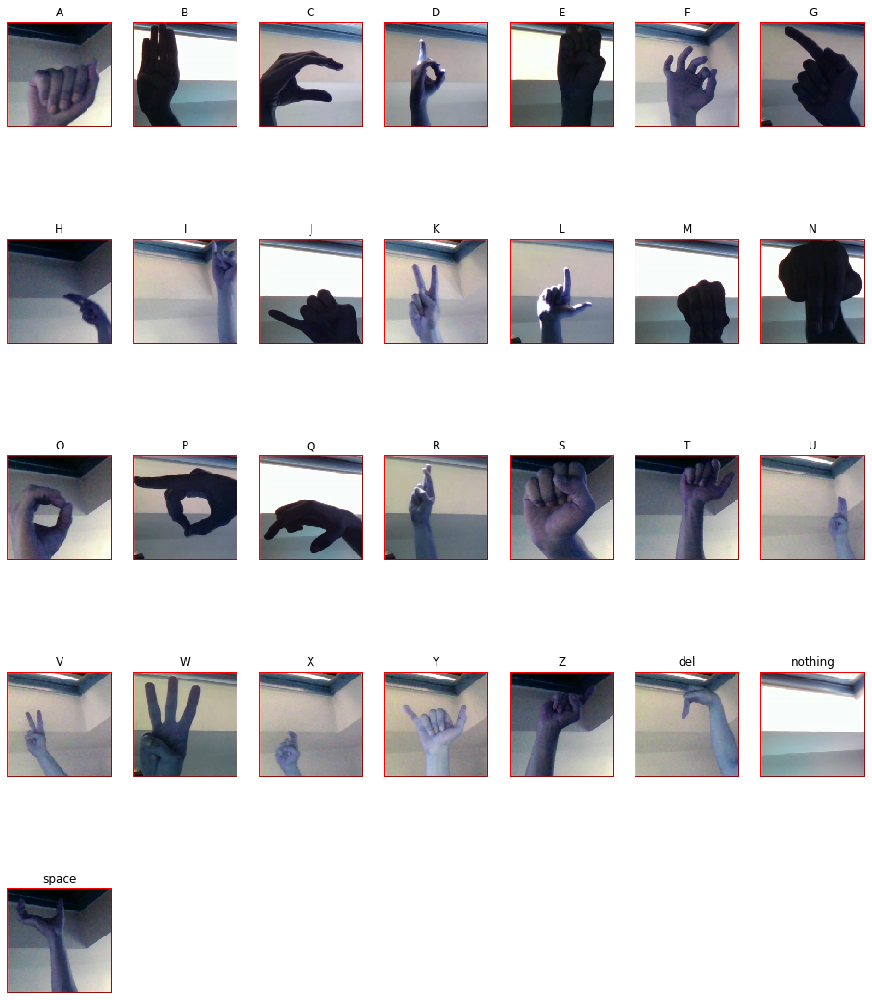

In [10]:
CLASSES = [folder[len(train_dir) + 1:] for folder in glob(train_dir + '/*')]
CLASSES.sort()

sample_images = []
def plot_one_sample_of_each(base_path):
    cols = 7
    rows = int(np.ceil(len(CLASSES) / cols))
    fig = plt.figure(figsize=(16, 20))
    
    for i in range(len(CLASSES)):
        cls = CLASSES[i]
        img_path = base_path + '/' + cls + '/**'
        path_contents = glob(img_path)
    
        imgs = random.sample(path_contents, 1)

        sp = plt.subplot(rows, cols, i + 1)
        img = cv2.imread(imgs[0])
        sample_images.append((img, cls))
        plt.imshow(img)
        plt.title(cls)
        sp.axis('off')
        
    plt.show()
    return

plot_one_sample_of_each(train_dir)

## Histograms of Pixel Intensities
Additionally, we plot the histogram of pixel intensities of images from each class.

In [0]:
#define function to plot histograms of pixel intensities for red, blue, and green
def plotHistogram(a, cls):
    """
    #Plot histogram of RGB Pixel Intensities
    """
    
    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(a)
    plt.title(cls)
    plt.axis('off')
    histo = plt.subplot(1,2,2)
    histo.set_ylabel('Count')
    histo.set_xlabel('Pixel Intensity')
    n_bins = 30
    plt.hist(a[:,:,0].flatten(), bins= n_bins, lw = 0, color='r', alpha=0.5);
    plt.hist(a[:,:,1].flatten(), bins= n_bins, lw = 0, color='g', alpha=0.5);
    plt.hist(a[:,:,2].flatten(), bins= n_bins, lw = 0, color='b', alpha=0.5);\


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


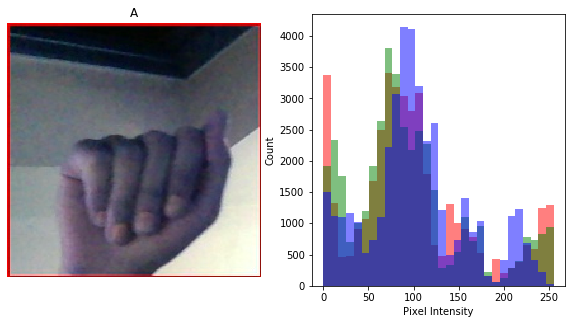

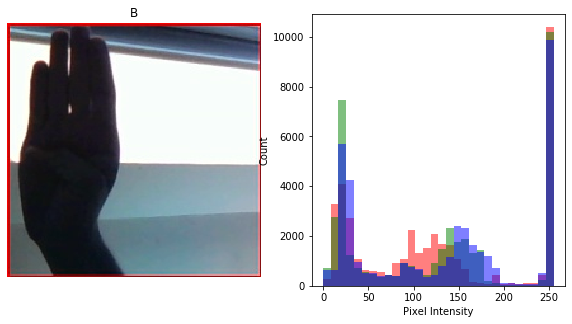

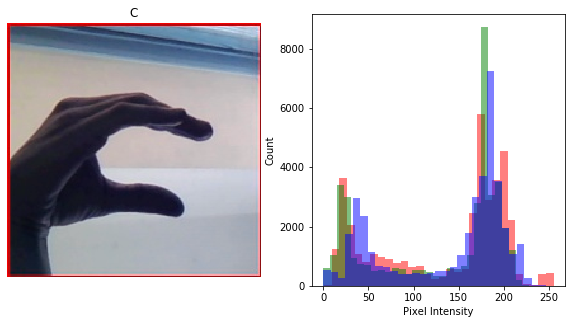

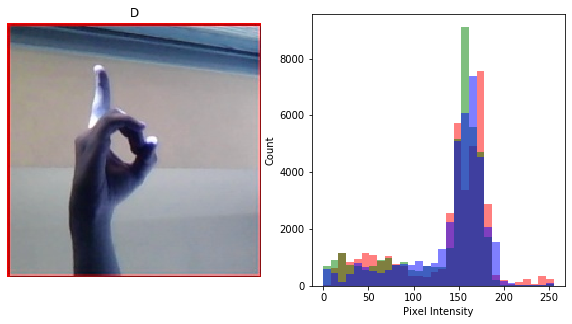

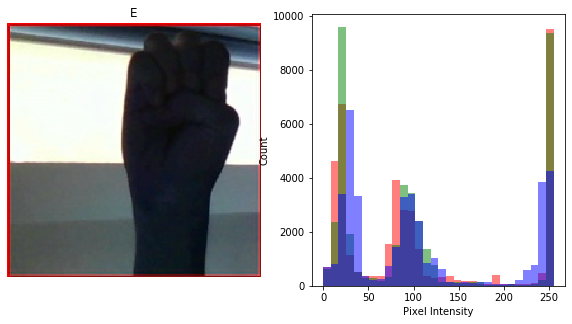

...

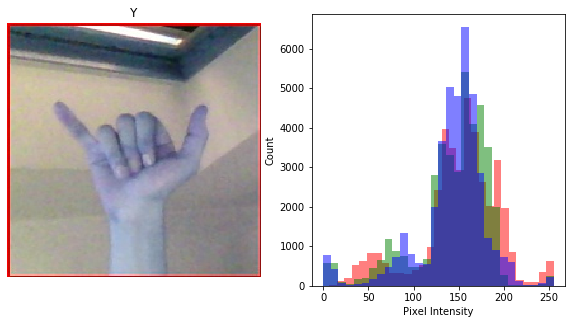

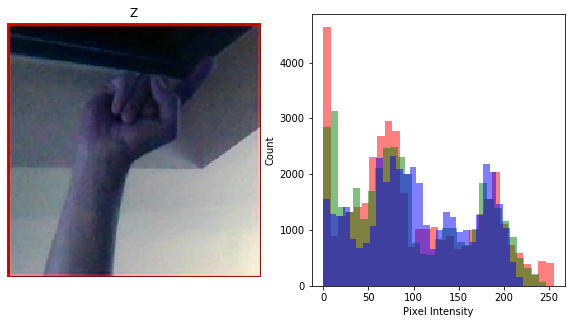

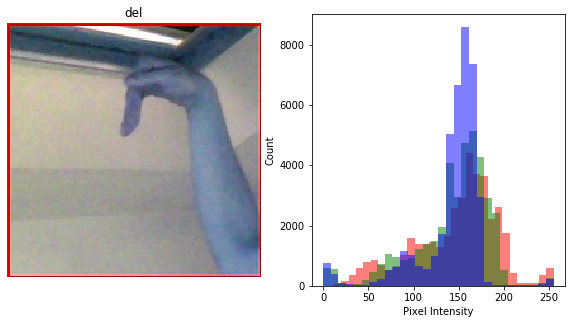

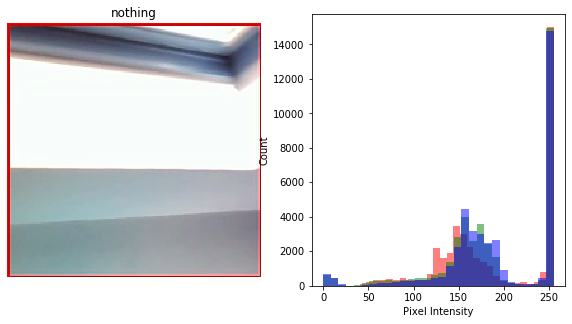

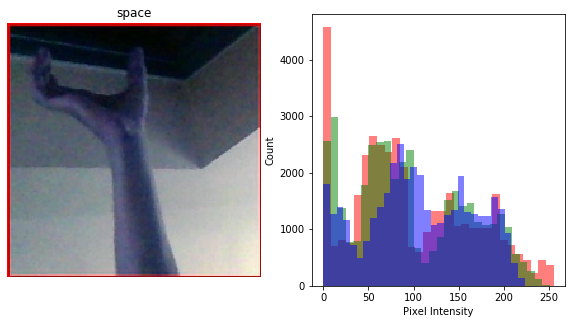

In [12]:
#plot one histogram for every class
for img in sample_images:
    plotHistogram(img[0], img[1])

### Reading data from file using our pre-defined method

In [13]:
images, labels, letters, samples = get_data(DATA_DIR)

/content/asl_alphabet_train/asl_alphabet_train/U
/content/asl_alphabet_train/asl_alphabet_train/Z
/content/asl_alphabet_train/asl_alphabet_train/J
/content/asl_alphabet_train/asl_alphabet_train/T
/content/asl_alphabet_train/asl_alphabet_train/A
/content/asl_alphabet_train/asl_alphabet_train/C
/content/asl_alphabet_train/asl_alphabet_train/del
/content/asl_alphabet_train/asl_alphabet_train/L
/content/asl_alphabet_train/asl_alphabet_train/V
/content/asl_alphabet_train/asl_alphabet_train/G
/content/asl_alphabet_train/asl_alphabet_train/B
/content/asl_alphabet_train/asl_alphabet_train/D
/content/asl_alphabet_train/asl_alphabet_train/W
/content/asl_alphabet_train/asl_alphabet_train/Y
/content/asl_alphabet_train/asl_alphabet_train/R
/content/asl_alphabet_train/asl_alphabet_train/nothing
/content/asl_alphabet_train/asl_alphabet_train/E
/content/asl_alphabet_train/asl_alphabet_train/S
/content/asl_alphabet_train/asl_alphabet_train/space
/content/asl_alphabet_train/asl_alphabet_train/F
/content

### Average image for each Character
We display the averages as black and white (grayscale) images because if we use the color version of the images, the averages are all white (sum of all colors = white) and hence we don't see any useful information.

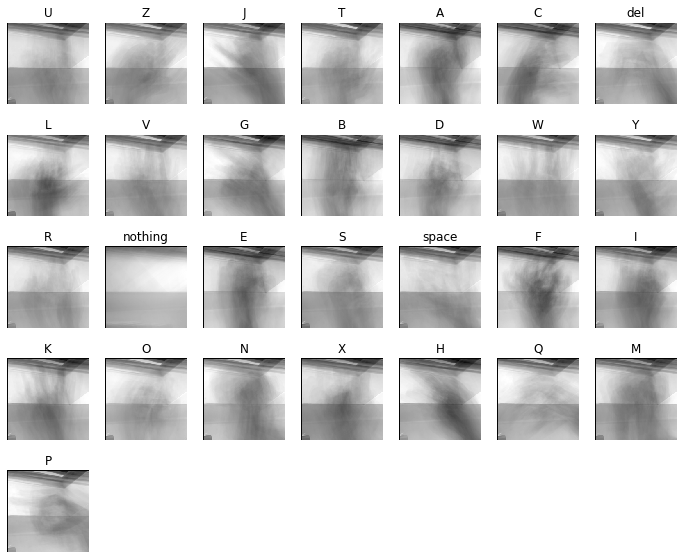

In [14]:
from google.colab import files

means = np.zeros((29, 200, 200))
for i in range(len(images)):
    means[labels[i]] += images[i].reshape(200,200)

fig=plt.figure(figsize=(12, 12))
columns = 7
rows = 6
for i in range(1, len(means)+1):
    img = means[i-1]
    fig.add_subplot(rows, columns, i)
    plt.axis('off')
    plt.title(samples[i-1][1])
    plt.imshow(img, cmap='gray')


#save and download to put in report
# plt.savefig("mean_image.png",bbox_inches='tight')
# files.download('mean_image.png')

plt.show()

### Mean Overall Image
This shows that the background is almost constant in all images and that this could lead to possible classification error when testing the model on custom data.

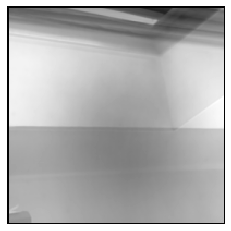

In [16]:
mean_all = np.zeros((200, 200))
for img in images:
    mean_all += img.reshape(200,200)
    
plt.imshow(mean_all, cmap='gray')
plt.axis('off')

#save and download to put in report
# plt.savefig("mean_overall.png")
# files.download('mean_overall.png')

plt.show()

### Verify correctness of our data import
There are 87000 images of size 200 x 200 pixels and we flatten each image into a 1 x 40000 feature vector for input into our neural network.

In [17]:
images.shape

(2900, 40000)

### Shuffle the data to introduce more randomness

In [0]:
#zip and shuffle the data for model
combined = list(zip(images, labels, letters))
random.shuffle(combined)

images[:], labels[:], letters[:] = zip(*combined)

In [0]:
# Converting our (integer) class vector into a binary class matrix
labels_categorical = to_categorical(labels)

In [20]:
#print shape for reference
labels_categorical.shape

(2900, 29)

### Getting necessary quantities for definition of neural network architecture

In [21]:
img_size = images[0].shape
print(img_size)
num_classes = len(labels_categorical[0])
print(num_classes)

(40000,)
29


## Shallow Neural Networks
We will implement two shallow neural network architectures. 
- A network with a single densely connected layer
- A network with two densely connected layers<br>
Both of which use a softmax activation function in the output layer to predict the class

In [22]:
# Single layer model with training data
'''
-Sequential -simplest kind of Kerasmodel,for neural networks that are just composed of a single stack of layers,
-Since the data is already flattened, we just specify 
    - the number of neurons (29), 
    - softmax activation since the classes are exclusive
    - input shape to be the shape of the image data (1x40000 feature vector)
-then print the summary
'''

single_layer_model = Sequential()  
single_layer_model.add(Dense(num_classes, activation='softmax', input_shape=img_size))
single_layer_model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 29)                1160029   
Total params: 1,160,029
Trainable params: 1,160,029
Non-trainable params: 0
_________________________________________________________________


In [0]:
'''
   - adam optimizer 
   - "categorical_crossentropy" loss since we have one target probability per class for each instance
   - check model with accuracy  
'''
single_layer_model.compile(optimizer='adam',
                           loss='categorical_crossentropy',
                           metrics=['accuracy'])

In [24]:
'''
Now we train the model:
    -input features
    -target classes
    -validation set :Keras will measure the loss and the extra metrics on this set at the
        end of each epoch
    -number of epochs to train
    -batch size
'''
single_layer_model.fit(images,
                       labels_categorical,
                       validation_split=0.2,
                       epochs=5,
                       batch_size=128)

Train on 2320 samples, validate on 580 samples
Epoch 1/5
2320/2320 [==============================] - 1s 533us/sample - loss: 42.8783 - acc: 0.0349 - val_loss: 65.4196 - val_acc: 0.0259
Epoch 2/5
2320/2320 [==============================] - 1s 239us/sample - loss: 46.5554 - acc: 0.0353 - val_loss: 24.3538 - val_acc: 0.0397
Epoch 3/5
2320/2320 [==============================] - 1s 240us/sample - loss: 15.8591 - acc: 0.0522 - val_loss: 10.5184 - val_acc: 0.0466
Epoch 4/5
2320/2320 [==============================] - 1s 244us/sample - loss: 7.3683 - acc: 0.0711 - val_loss: 6.0899 - val_acc: 0.0448
Epoch 5/5
2320/2320 [==============================] - 1s 244us/sample - loss: 4.7694 - acc: 0.0974 - val_loss: 5.0980 - val_acc: 0.0466


In [25]:
# Two-layer model with training data
'''
-Sequential
- relu activation hidden layer
    - 512 neurons
    - relu activation
    - input shape to be the shape of the image data (1x40000 feature vector)
- softmax activation layer
    - the number of neurons (29), 
    - softmax activation since the classes are exclusive
-compile model
    -same as one layer
-then print the summary
'''

two_layer_model = Sequential()
two_layer_model.add(Dense(512, activation='relu', input_shape=img_size))
two_layer_model.add(Dense(num_classes, activation='softmax'))
two_layer_model.compile(optimizer='adam',
                        loss='categorical_crossentropy',
                        metrics=['accuracy'])
two_layer_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 512)               20480512  
_________________________________________________________________
dense_2 (Dense)              (None, 29)                14877     
Total params: 20,495,389
Trainable params: 20,495,389
Non-trainable params: 0
_________________________________________________________________


In [26]:
#fit model to data
two_layer_model.fit(images,
                    labels_categorical,
                    validation_split=0.2,
                    epochs=5,
                    batch_size=128)

Train on 2320 samples, validate on 580 samples
Epoch 1/5
2320/2320 [==============================] - 1s 303us/sample - loss: 56.1500 - acc: 0.0358 - val_loss: 51.0221 - val_acc: 0.0293
Epoch 2/5
2320/2320 [==============================] - 1s 276us/sample - loss: 25.7015 - acc: 0.0448 - val_loss: 6.9988 - val_acc: 0.0534
Epoch 3/5
2320/2320 [==============================] - 1s 272us/sample - loss: 4.0801 - acc: 0.0306 - val_loss: 3.3673 - val_acc: 0.0397
Epoch 4/5
2320/2320 [==============================] - 1s 273us/sample - loss: 3.3673 - acc: 0.0332 - val_loss: 3.3674 - val_acc: 0.0397
Epoch 5/5
2320/2320 [==============================] - 1s 271us/sample - loss: 3.3673 - acc: 0.0323 - val_loss: 3.3674 - val_acc: 0.0190


## Convolutional Neural Networks
We again look at two CNN architectures
- One convolutional layer, one max-pooling layer followed by a fully connected layer
- Two convolutional layers, two max-pooling layers followed by a fully connected layer

### Reshaping data into 200 x 200 arrays for input to CNNs

In [0]:
#The data is reshaped to be numpy arrays of shape 200x200 for the purpose of convolution
images_2d = images.reshape(len(images), 200, 200, -1)

In [0]:
img_2d_shape = images_2d[0].shape

In [29]:
'''
We again use a Sequential model for our network and define a simple CNN with one convolutional layer:

    Convolutional hidden layer - 32 layers with kernel size 3x3 with ReLu activation.
    Max pooling layer - pooling size 2x2
    Flattening layer - to prepare for a fully-connected layer for output
    Dense layer - 29 output neurons  with softmax activation function

Then compile model.

'''
simple_convnet_model = Sequential()
simple_convnet_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=img_2d_shape))
simple_convnet_model.add(MaxPooling2D((2, 2)))
simple_convnet_model.add(Flatten())
simple_convnet_model.add(Dense(num_classes, activation='softmax'))
simple_convnet_model.summary()

simple_convnet_model.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 198, 198, 32)      320       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 99, 99, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 313632)            0         
_________________________________________________________________
dense_3 (Dense)              (None, 29)                9095357   
Total params: 9,095,677
Trainable params: 9,095,677
Non-trainable params: 0
_________________________________________________________________


In [30]:
#fit model to the data
simple_convnet_model.fit(images_2d,
                         labels_categorical,
                         validation_split=0.2,
                         epochs=5,
                         batch_size=128)

Train on 2320 samples, validate on 580 samples
Epoch 1/5
2320/2320 [==============================] - 4s 2ms/sample - loss: 18.7369 - acc: 0.0353 - val_loss: 9.0442 - val_acc: 0.0414
Epoch 2/5
2320/2320 [==============================] - 1s 490us/sample - loss: 4.9855 - acc: 0.0487 - val_loss: 3.4078 - val_acc: 0.0483
Epoch 3/5
2320/2320 [==============================] - 1s 487us/sample - loss: 3.3402 - acc: 0.0918 - val_loss: 3.3701 - val_acc: 0.0500
Epoch 4/5
2320/2320 [==============================] - 1s 488us/sample - loss: 3.2799 - acc: 0.1086 - val_loss: 3.4101 - val_acc: 0.0466
Epoch 5/5
2320/2320 [==============================] - 1s 487us/sample - loss: 3.1017 - acc: 0.1767 - val_loss: 3.4486 - val_acc: 0.0672


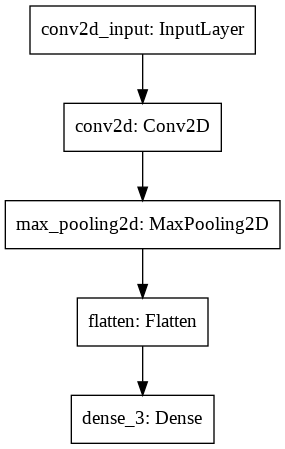

In [31]:
#plot the pipeline of the model for reference
plot_model(simple_convnet_model, to_file='model.png')

In [32]:
'''We again use a Sequential model for our network and define a simple CNN with one convolutional layer

    Model Architecture:
    First Convolutional hidden layer - 32 layers with kernel size 3x3 with ReLu activation.
    Max pooling layer - pooling size 2x2
    Second Convolutional hidden layer - 32 layers with kernel size 3x3 with ReLu activation.
    Max pooling layer - pooling size 2x2
    Flattening layer - to prepare for a fully-connected layer for output
    Dense layer - 29 output neurons  with ‘softmax’ activation function
'''
deeper_convnet_model = Sequential()
deeper_convnet_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=img_2d_shape))
deeper_convnet_model.add(MaxPooling2D((2, 2)))
deeper_convnet_model.add(Conv2D(32, (3, 3), activation='relu'))
deeper_convnet_model.add(MaxPooling2D((2, 2)))
deeper_convnet_model.add(Flatten())
deeper_convnet_model.add(Dense(num_classes, activation='softmax'))
deeper_convnet_model.summary()

deeper_convnet_model.compile(optimizer='adam',
                             loss='categorical_crossentropy',
                             metrics=['accuracy'])

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 198, 198, 32)      320       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 97, 97, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 73728)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 29)                2138141   
Total params: 2,147,709
Trainable params: 2,147,709
Non-trainable params: 0
____________________________________________

In [33]:
#fit model to data
deeper_convnet_model.fit(images_2d,
                         labels_categorical,
                         validation_split=0.2,
                         epochs=5,
                         batch_size=128)

Train on 2320 samples, validate on 580 samples
Epoch 1/5
2320/2320 [==============================] - 2s 731us/sample - loss: 3.6163 - acc: 0.0483 - val_loss: 3.3661 - val_acc: 0.0466
Epoch 2/5
2320/2320 [==============================] - 1s 593us/sample - loss: 3.3226 - acc: 0.0918 - val_loss: 3.3807 - val_acc: 0.0483
Epoch 3/5
2320/2320 [==============================] - 1s 590us/sample - loss: 3.1311 - acc: 0.1685 - val_loss: 3.4458 - val_acc: 0.0776
Epoch 4/5
2320/2320 [==============================] - 1s 595us/sample - loss: 2.8281 - acc: 0.2487 - val_loss: 3.6778 - val_acc: 0.0517
Epoch 5/5
2320/2320 [==============================] - 1s 599us/sample - loss: 2.4975 - acc: 0.3444 - val_loss: 3.8643 - val_acc: 0.0776


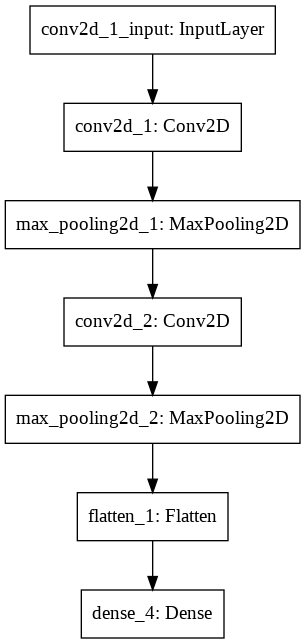

In [34]:
#plot pipeline of model
plot_model(deeper_convnet_model, to_file='model.png')

In [35]:
#create a table of the accuracy of the training and validation set as well as the loss of each model 
models = ['1 Layer Shallow', '2 Layer Shallow', '1 Layer CNN', '2 Layer CNN']
training_set_accuracies = [0.0710, 0.0347, 0.5252, 0.5553]
val_set_accuracies = [0.0368, 0.0318, 0.1206, 0.1271]
losses = [30.9496, 3.3675, 2.0274, 1.9657]
results = zip(models, training_set_accuracies, val_set_accuracies, losses)
results_df = pd.DataFrame(results, columns = ['Model', 'Training Set Accuracy', 'Validation Set Accuracy', 'Loss'])
results_df

,Model,Training Set Accuracy,Validation Set Accuracy,Loss
0,1 Layer Shallow,0.0710,0.0368,30.9496
1,2 Layer Shallow,0.0347,0.0318,3.3675
2,1 Layer CNN,0.5252,0.1206,2.0274
3,2 Layer CNN,0.5553,0.1271,1.9657


# Deeper Neural Network Model
Testing the model by top answer on kaggle.
Model created by Dan Becker.

https://www.kaggle.com/dansbecker/running-kaggle-kernels-with-a-gpu


In [36]:
my_model = Sequential()
my_model.add(Conv2D(64, kernel_size=4, strides=1, activation='relu', input_shape=target_dims))
my_model.add(Conv2D(64, kernel_size=4, strides=2, activation='relu'))
my_model.add(Dropout(0.5))
my_model.add(Conv2D(128, kernel_size=4, strides=1, activation='relu'))
my_model.add(Conv2D(128, kernel_size=4, strides=2, activation='relu'))
my_model.add(Dropout(0.5))
my_model.add(Conv2D(256, kernel_size=4, strides=1, activation='relu'))
my_model.add(Conv2D(256, kernel_size=4, strides=2, activation='relu'))
my_model.add(Flatten())
my_model.add(Dropout(0.5))
my_model.add(Dense(512, activation='relu'))
my_model.add(Dense(n_classes, activation='softmax'))

my_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=["accuracy"])
my_model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 61, 61, 64)        3136      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 29, 29, 64)        65600     
_________________________________________________________________
dropout (Dropout)            (None, 29, 29, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 26, 26, 128)       131200    
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 12, 12, 128)       262272    
_________________________________________________________________
dropout_1 (Dropout)          (None, 12, 12, 128)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 9, 9, 256)        

In [37]:
my_model.fit_generator(train_generator, epochs=5, validation_data=val_generator)

Epoch 1/5
306/306 [==============================] - 92s 301ms/step - loss: 1.5923 - acc: 0.5071 - val_loss: 0.7722 - val_acc: 0.7297
Epoch 2/5
306/306 [==============================] - 88s 289ms/step - loss: 0.3156 - acc: 0.8903 - val_loss: 0.5056 - val_acc: 0.8417
Epoch 3/5
306/306 [==============================] - 88s 286ms/step - loss: 0.1698 - acc: 0.9419 - val_loss: 0.6099 - val_acc: 0.8570
Epoch 4/5
306/306 [==============================] - 87s 286ms/step - loss: 0.1204 - acc: 0.9593 - val_loss: 0.6575 - val_acc: 0.8367
Epoch 5/5
306/306 [==============================] - 87s 285ms/step - loss: 0.0895 - acc: 0.9702 - val_loss: 0.6426 - val_acc: 0.8475


## ResNet 50
To conclude our evaluation we will implement a 50 layer Residual Network (ResNet-50) which has been proven to perform well for image classification tasks. We slightly modify the base model defined by Keras to include a global average pooling layer and a dropout layer before our final dense prediction layer. The main purpose of these two layers is to reduce the number of trainable parameters in the model and hence reduce the overall variance in the model as a method of reducing the possibility of overfitting.

In [38]:
# Base ResNet-50 model as pre-defined by Keras
base_model = ResNet50(weights= None, include_top=False, input_shape=target_dims)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.7)(x)
predictions = Dense(n_classes, activation='softmax')(x)
resnet_model = Model(inputs=base_model.input, outputs=predictions)


In [39]:
# Compile and view the model summary
resnet_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=["accuracy"])
resnet_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 64, 64, 3)]  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 70, 70, 3)    0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 32, 32, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 32, 32, 64)   256         conv1_conv[0][0]                 
______________________________________________________________________________________________

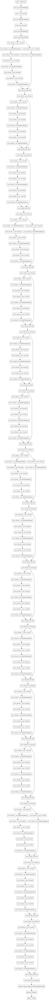

In [40]:
# Visualize the model architecture
# We can see the 'residual' nature of this model as compared to our previous sequential models
plot_model(resnet_model, to_file='model.png')

In [41]:
# Fit the model keeping consistent our train-validation split from previous runs
resnet_model.fit_generator(train_generator, epochs=25, validation_data=val_generator)

Epoch 1/25
306/306 [==============================] - 115s 375ms/step - loss: 1.7452 - acc: 0.5620 - val_loss: 3.0653 - val_acc: 0.4267
Epoch 2/25
306/306 [==============================] - 100s 326ms/step - loss: 0.6155 - acc: 0.8689 - val_loss: 121.6761 - val_acc: 0.0345
Epoch 3/25
306/306 [==============================] - 100s 326ms/step - loss: 0.1312 - acc: 0.9592 - val_loss: 0.7051 - val_acc: 0.8414
Epoch 4/25
306/306 [==============================] - 100s 327ms/step - loss: 0.0334 - acc: 0.9894 - val_loss: 0.5250 - val_acc: 0.8928
Epoch 5/25
306/306 [==============================] - 99s 325ms/step - loss: 0.0287 - acc: 0.9911 - val_loss: 0.5653 - val_acc: 0.8855
Epoch 6/25
306/306 [==============================] - 100s 326ms/step - loss: 0.0385 - acc: 0.9899 - val_loss: 3.1492 - val_acc: 0.6083
Epoch 7/25
306/306 [==============================] - 100s 326ms/step - loss: 0.0432 - acc: 0.9873 - val_loss: 0.9636 - val_acc: 0.8282
Epoch 8/25
306/306 [===========================

## Conclusion
As we can see, our results align with our expectations. The first two shallow neural network models are both trained much faster than the convolutional neural network models but they do not have the predictive power to make any meaningful predictions about our data set. Both of these models result in a validation-set accuracy of around 0.03-0.04 which is actually no better than a Naive Bayes classifier (i.e. if you randomly assigned an image to a class, you would be correct with a probability of approximately 1/29 ~ accuracy of 0.034). 
<br><br>
Our convolutional neural network models, even though their architectures were chosen arbitrarily without too much thought or experimentation, clearly show much more predictive power. Even our single layer CNN model with only one convolutional layer and one pooling layer results in an accuracy of 0.5252
<br><br>
When we use a deep neural network which is specifically designed for image classification with multiple convolutional layers as well as the introduction of dropout layers, we see a huge jump in performance. This really showcases the power of CNNs as well as the importance of network architecture in Computer Vision. 

In [42]:
#plot results in table
models = ['1 Layer Shallow', '2 Layer Shallow', '1 Layer CNN', '2 Layer CNN', 'Deep Neural Network', 'ResNet-50']
training_set_accuracies = [0.0710, 0.0347, 0.5252, 0.5553, 0.9722, 0.9989]
val_set_accuracies = [0.0368, 0.0318, 0.1206, 0.1271, 0.8579, 0.9084]
losses = [30.9496, 3.3675, 2.0274, 1.9657, 0.0845, 0.0038]
results = zip(models, losses, training_set_accuracies, val_set_accuracies)
results_df = pd.DataFrame(results, columns = ['Model', 'Loss', 'Training Set Accuracy', 'Validation Set Accuracy'])
results_df

,Model,Loss,Training Set Accuracy,Validation Set Accuracy
0,1 Layer Shallow,30.9496,0.0710,0.0368
1,2 Layer Shallow,3.3675,0.0347,0.0318
2,1 Layer CNN,2.0274,0.5252,0.1206
3,2 Layer CNN,1.9657,0.5553,0.1271
4,Deep Neural Network,0.0845,0.9722,0.8579
5,ResNet-50,0.0038,0.9989,0.9084
